In [1]:
import torch
import random
import copy
import itertools
import numpy as np
from sklearn.metrics import classification_report, accuracy_score
import utils
from LIM_deep_neural_classifier import LIMDeepNeuralClassifier
import dataset_addition as da
from trainer import LIMTrainer
import matplotlib.pyplot as plt

C:\Users\attic\anaconda3\envs\bigkid\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
utils.fix_random_seeds()

# Five Digit Addition



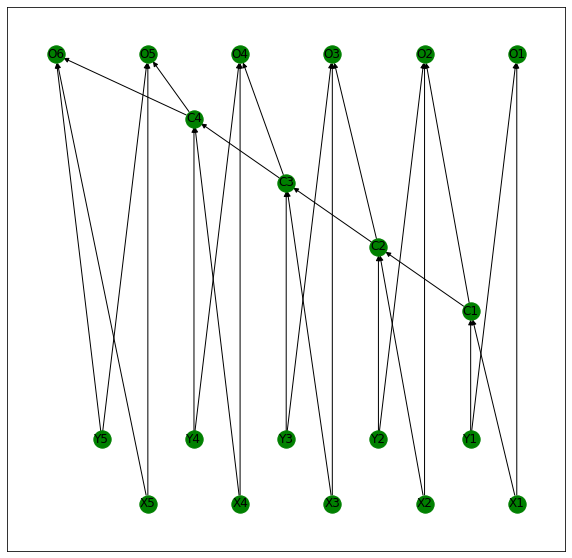

In [3]:
model = da.highlevel_tall_model()
model.print_structure()

In [4]:
input = model.sample_input()

In [22]:
counts = {(c,o):0 for c in ["C4", "C3", "C2", "C1"] for o in  ["O6","O5","O4", "O3", "O2", "O1"] if int(c[1])+1 < int(o[1])}
for _ in range(10000):
    i = model.sample_input()
    paths = model.find_live_paths(i)
    for (c,o) in counts:
        for k in paths:
            for path in paths[k]:
                if path[0] == c and path[-1] == o:
                    counts[(c,o)] += 1
for c in ["C4", "C3", "C2", "C1"]:
    print("\n From " + c)
    for o in  ["O6","O5","O4", "O3", "O2", "O1"]:
        if int(c[1])+1 < int(o[1]):
            print(" To ", o,counts[(c,o)], " ")


 From C4
 To  O6 960  

 From C3
 To  O6 99  
 To  O5 1009  

 From C2
 To  O6 11  
 To  O5 102  
 To  O4 1005  

 From C1
 To  O6 0  
 To  O5 7  
 To  O4 93  
 To  O3 911  


In [6]:
da.get_path_maxlen_filter(model,[2])

<function dataset_addition.get_path_maxlen_filter.<locals>.check_path(total_setting)>

In [7]:
result = da.get_circuit_samplers()

In [8]:
print(result)

{'O1': {}, 'O2': {}, 'O3': {'C1': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A8B0>}, 'O4': {'C2': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A670>, 'C1': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A820>}, 'O5': {'C3': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A4C0>, 'C2': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A5E0>, 'C1': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A790>}, 'O6': {'C4': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A3A0>, 'C3': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A310>, 'C2': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A550>, 'C1': <function sample_live_circuit.<locals>.sampler at 0x000001C3D8A6A700>}}


# Training Model on Uniformly Distributed Data


In [9]:
def custom_classification(LIM_trainer,X, y, target=None, verbose=False):
    results = dict()
    preds = da.decode_preds(LIM_trainer.predict_logits(X))
    if target is None or "O6" in target:
        if verbose:
            print("OUTPUT O6")
            print(classification_report(y[:,0].cpu(), preds["O6"].cpu()))
        results["O6"] = accuracy_score(y[:,0].cpu(), preds["O6"].cpu())
    for i in range(5):
        if target is None or "O" +str(5-i) in target:
            if verbose:
                print("\nOUTPUT O" + str(5-i))
                print(classification_report(y[:,i+1].cpu(), preds["O"+str(5-i)].cpu()))
            results["O" + str(5-i)] = accuracy_score(y[:,i+1].cpu(), preds["O"+str(5-i)].cpu())
    return results
            


In [10]:
embedding_dim = 256

In [11]:
LIM = LIMDeepNeuralClassifier(
    hidden_dim=embedding_dim*4, 
    hidden_activation=torch.nn.ReLU(), 
    num_layers=3,
    input_dim=embedding_dim*10,
    n_classes=52,
    embedding_size_and_dim = (10,embedding_dim)
    )

LIM_trainer = LIMTrainer(
    LIM,
    warm_start=True,
    max_iter=10,
    batch_size=64,
    n_iter_no_change=10000,
    shuffle_train=False,
    eta=0.001,
    loss=da.addition_loss)

In [12]:
X_train, y_train = da.sampler_to_dataset(model.sample_input, 100000, model)

In [13]:
_ = LIM_trainer.fit(X_train, y_train)

Finished epoch 10 of 10; error is 293.18873514048755

In [14]:
custom_classification(LIM_trainer, X_train, y_train)

{'O6': 0.99676,
 'O5': 0.99022,
 'O4': 0.99659,
 'O3': 0.99187,
 'O2': 0.99482,
 'O1': 0.99567}

In [15]:
circuit_samplers = da.get_circuit_samplers()
print("No Active Paths with Length > 3 ")
X, y = da.sampler_to_dataset(lambda : model.sample_input(mandatory=da.get_path_maxlen_filter(model,[3])), 10000, model)
custom_classification(LIM_trainer,X, y)
for o in circuit_samplers:
    print("\n\n\n\nOutput Digit " + o)
    for c in circuit_samplers[o]:
        print("Active path from " + c)
        X, y = da.sampler_to_dataset(circuit_samplers[o][c], 10000, model)
        accs = custom_classification(LIM_trainer,X, y, target=[o], verbose=True)

No Active Paths with Length > 3 




Output Digit O1




Output Digit O2




Output Digit O3
Active path from C1
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,


OUTPUT O3
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96       607
         1.0       0.99      0.95      0.97      1112
         2.0       0.99      0.99      0.99      1180
         3.0       0.99      0.98      0.99      1160
         4.0       0.97      1.00      0.98      1088
         5.0       0.96      0.98      0.97      1027
         6.0       0.94      0.95      0.95      1124
         7.0       0.97      0.94      0.95      1097
         8.0       0.98      0.97      0.98      1060
         9.0       1.00      0.97      0.98       545

    accuracy                           0.97     10000
   macro avg       0.97      0.97      0.97     10000
weighted avg       0.97      0.97      0.97     10000





Output Digit O4
Active path from C2
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99       583
         1.0       0.99      0.99      0.99      1082
         2.0       0.98      0.99      0.98      1113
         3.0       1.00      0.98      0.99      1120
         4.0       0.98      1.00      0.99      1109
         5.0       1.00      0.98      0.99      1088
         6.0       0.97      1.00      0.98      1094
         7.0       0.99      0.97      0.98      1162
         8.0       1.00      0.99      0.99      1092
         9.0       1.00      0.99      1.00       557

    accuracy                           0.99     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       0.99      0.99      0.99     10000

Active path from C1
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [16]:
batch_size = 64
LIM = LIMDeepNeuralClassifier(
    hidden_dim=embedding_dim*4, 
    hidden_activation=torch.nn.ReLU(), 
    num_layers=4,
    input_dim=embedding_dim*10,
    n_classes=52,
    embedding_size_and_dim = (10,embedding_dim)
    )

LIM_trainer = LIMTrainer(
    LIM,
    warm_start=True,
    max_iter=1,
    batch_size=batch_size,
    n_iter_no_change=10000,
    shuffle_train=False,
    eta=0.001,
    loss=da.addition_loss)

In [17]:
X_train, y_train = da.sampler_to_dataset(model.sample_input, 10000000, model)

In [18]:
def show_graph(totalAcc):
    for o in totalAcc:
        fig, ax = plt.subplots(figsize=(5, 2.7))
        for c in totalAcc[o]:
            ax.plot(totalAcc[o][c], label=c)
        ax.set_title(o)
        plt.show()


In [19]:
totalAcc = {"O"+str(i):dict() for i in range(1,7)}
circuit_samplers = da.get_circuit_samplers()
data_cache = dict()
data_cache["random"] = da.sampler_to_dataset(model.sample_input, 10000, model)
data_cache["other"] = da.sampler_to_dataset(lambda : model.sample_input(mandatory=da.get_path_maxlen_filter(model,[3])), 10000, model)
for o in circuit_samplers:
    totalAcc[o]["other"] = []
    totalAcc[o]["random"] = []
    for c in circuit_samplers[o]:
        data_cache[(o,c)] = da.sampler_to_dataset(circuit_samplers[o][c], 10000, model)
        print((o,c), data_cache[(o,c)][0][0])
        print((o,c), data_cache[(o,c)][0][1])
        totalAcc[o][c] = []


[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3, 6), (4, 5), (5, 4), (6, 3), (7, 2), (8, 1), (9, 0)]
[(0, 9), (1, 8), (2, 7), (3,

Finished epoch 1 of 1; error is 3.2995998859405518

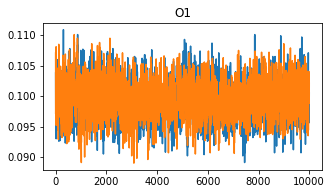

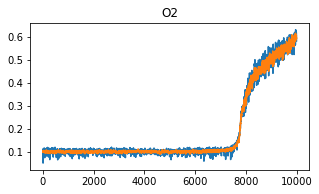

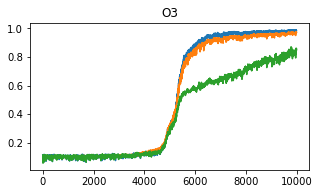

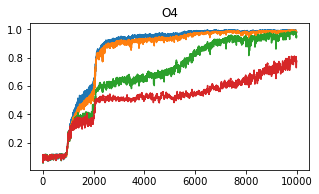

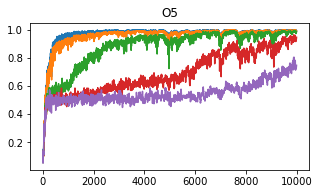

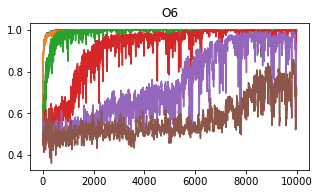

Finished epoch 1 of 1; error is 3.2050592899322513

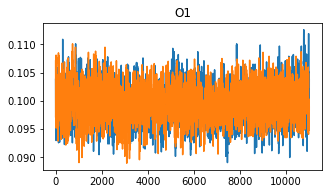

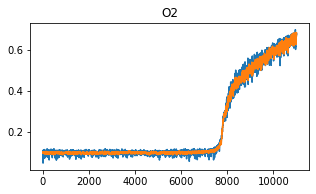

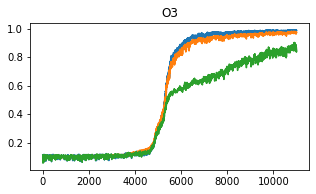

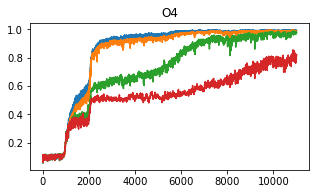

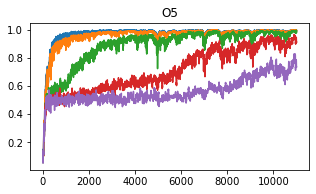

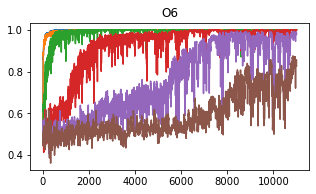

Finished epoch 1 of 1; error is 3.1045613288879395

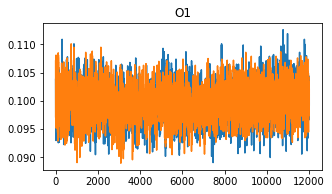

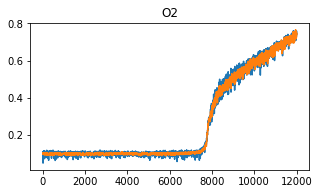

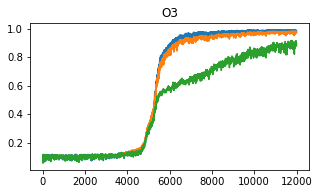

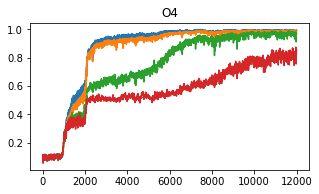

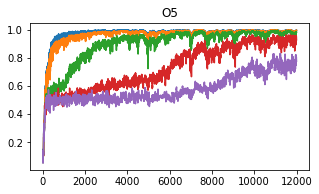

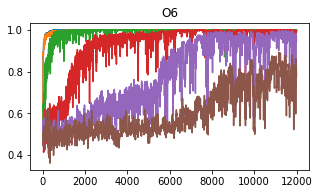

Finished epoch 1 of 1; error is 2.7011909484863287

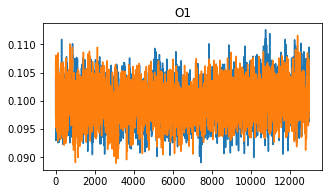

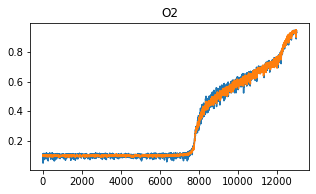

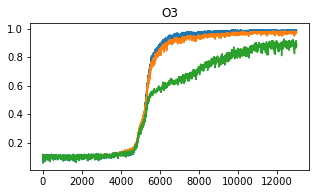

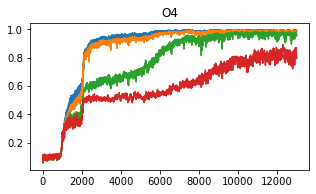

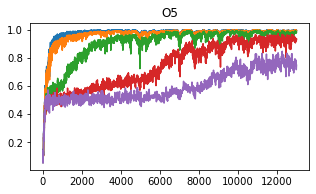

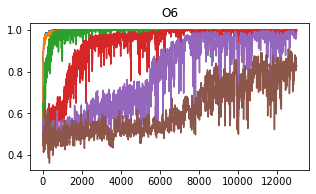

Finished epoch 1 of 1; error is 2.6384139060974127

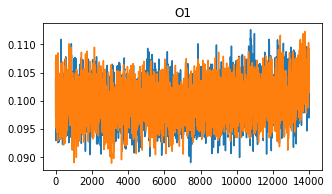

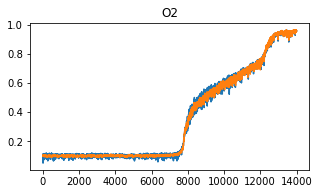

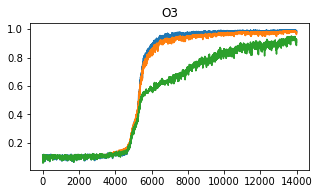

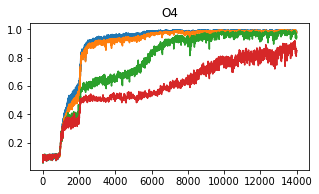

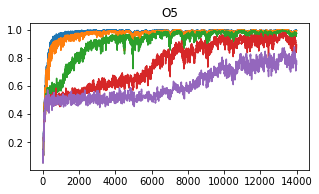

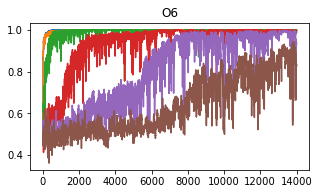

Finished epoch 1 of 1; error is 2.7986042499542236

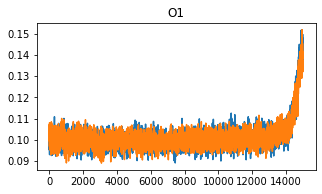

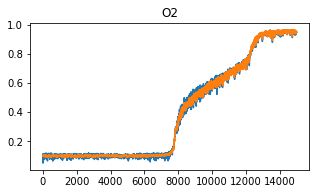

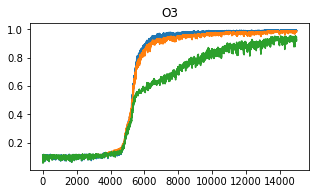

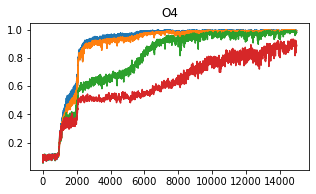

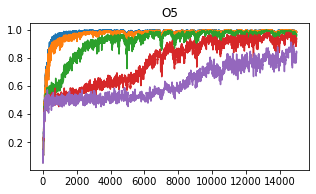

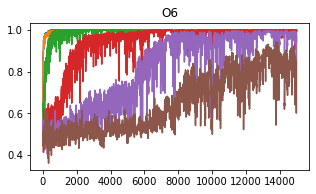

Finished epoch 1 of 1; error is 2.1252386569976807

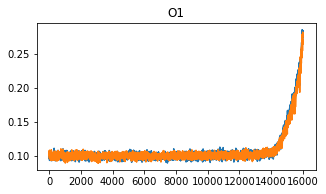

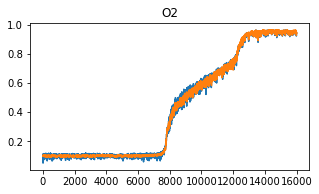

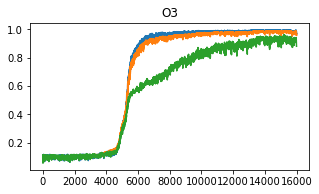

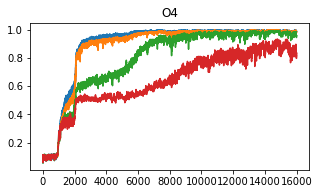

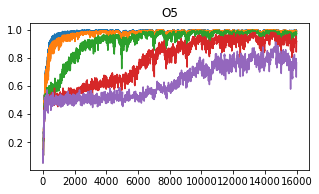

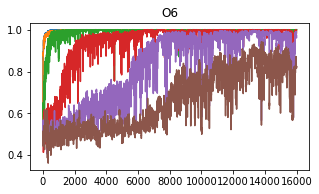

Finished epoch 1 of 1; error is 1.0098093748092651

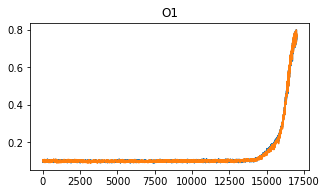

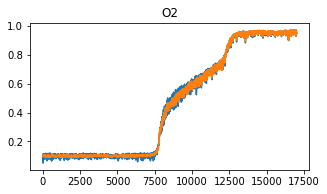

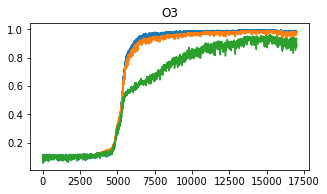

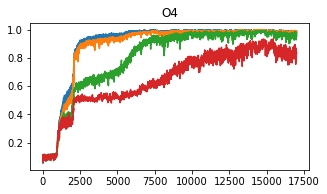

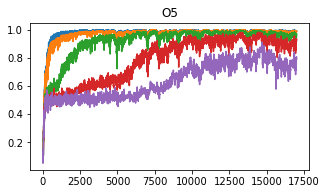

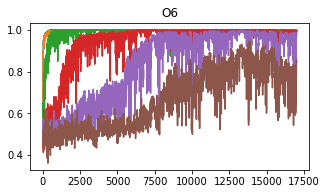

Finished epoch 1 of 1; error is 0.30548346042633057

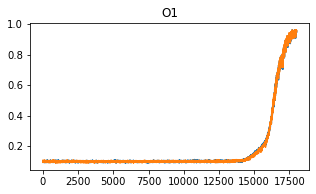

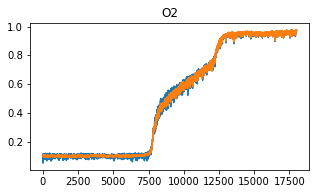

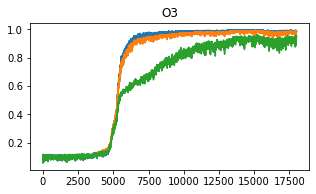

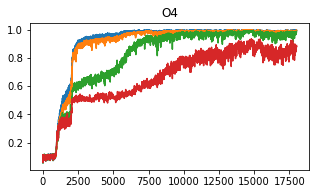

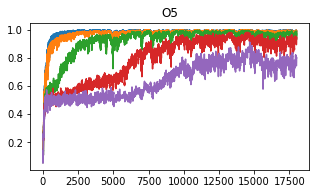

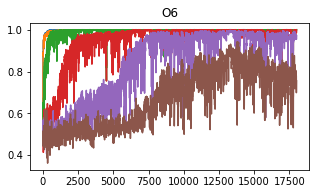

Finished epoch 1 of 1; error is 0.234012380242347726

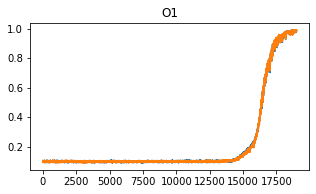

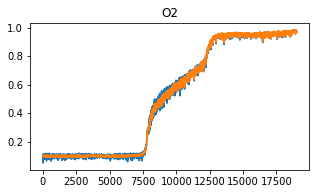

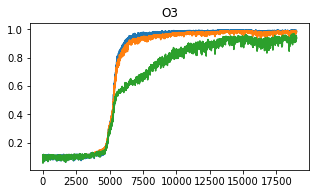

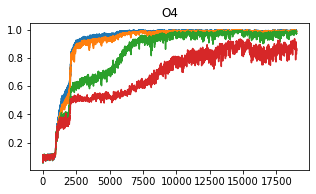

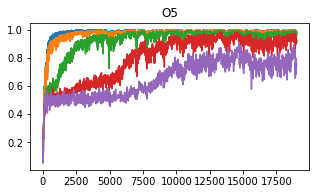

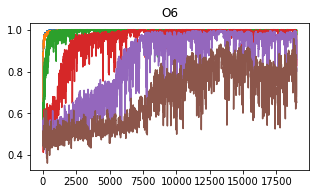

Finished epoch 1 of 1; error is 0.040816795080900197

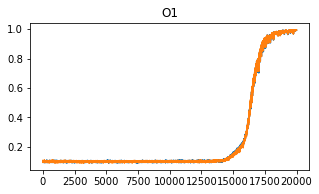

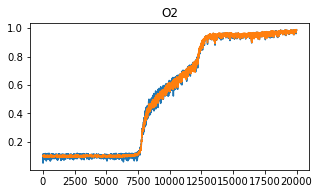

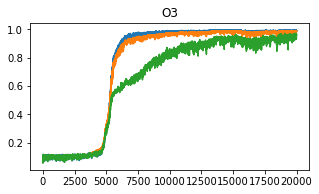

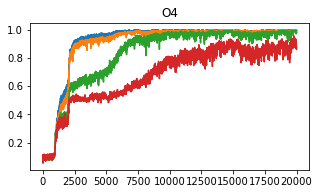

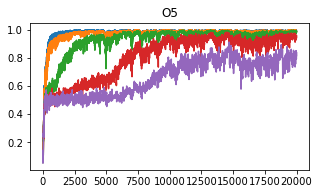

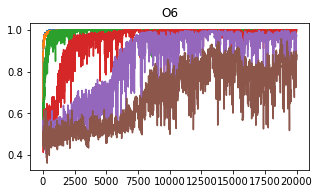

Finished epoch 1 of 1; error is 0.208317920565605164

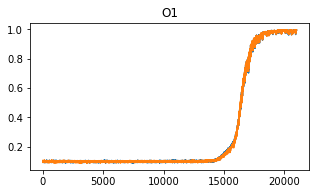

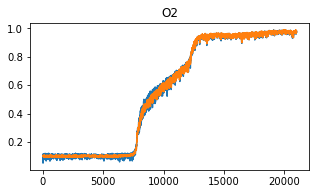

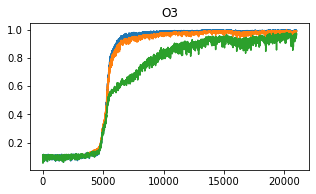

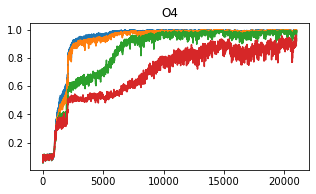

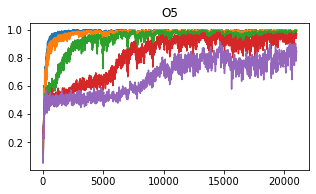

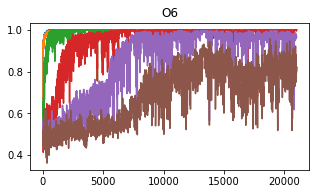

Finished epoch 1 of 1; error is 0.087633751332759866

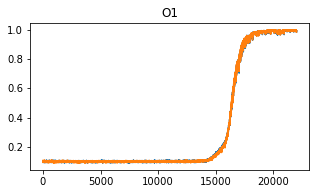

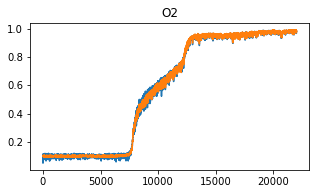

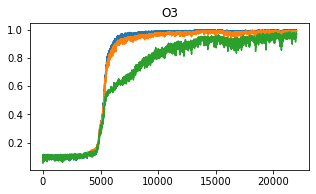

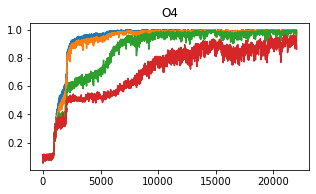

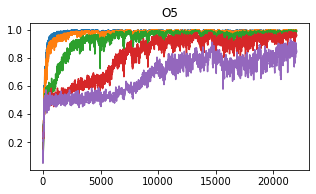

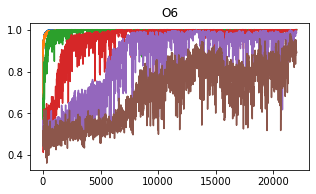

Finished epoch 1 of 1; error is 0.131690800189971926

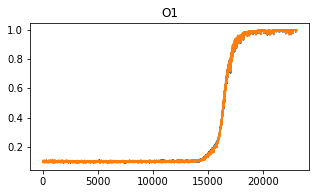

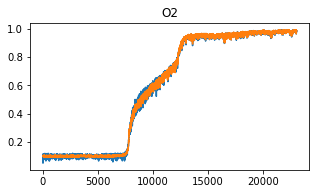

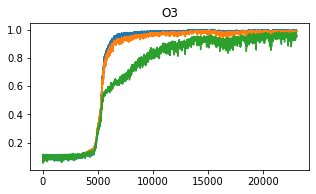

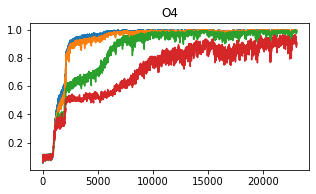

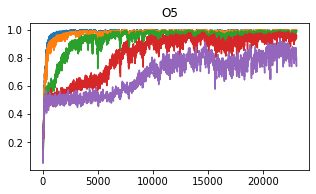

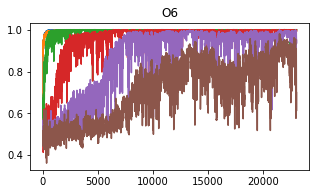

Finished epoch 1 of 1; error is 0.046234562993049624

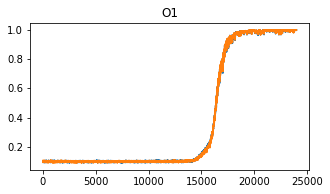

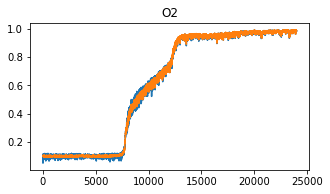

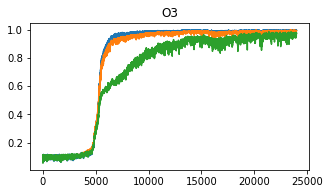

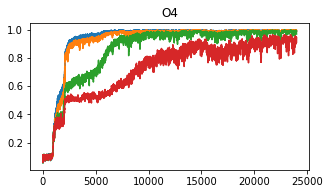

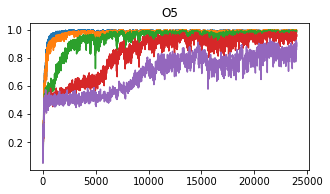

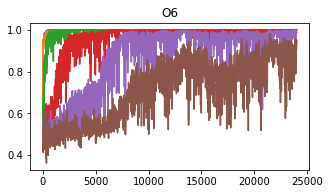

Finished epoch 1 of 1; error is 0.0691559165716171385

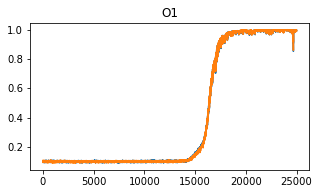

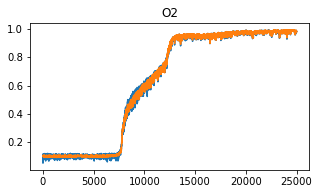

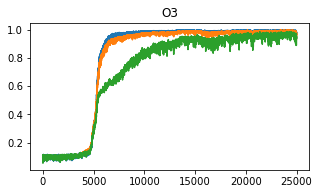

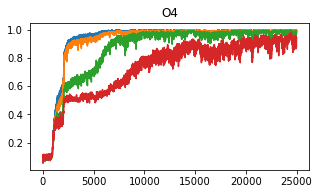

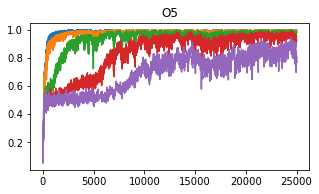

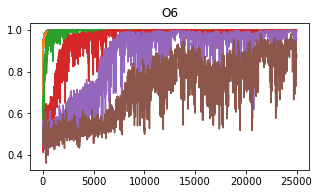

Finished epoch 1 of 1; error is 0.0228872090578079255

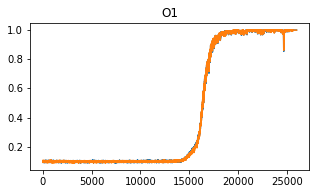

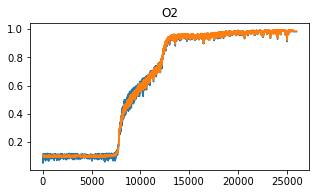

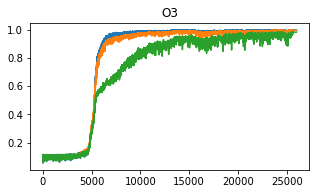

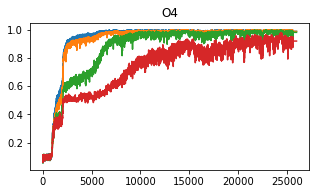

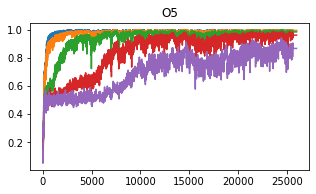

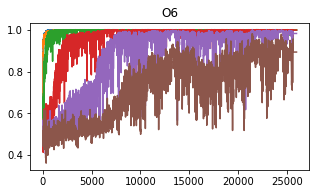

Finished epoch 1 of 1; error is 0.0

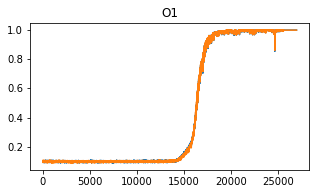

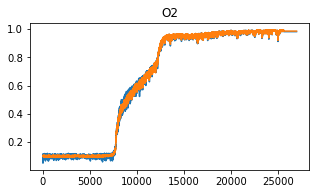

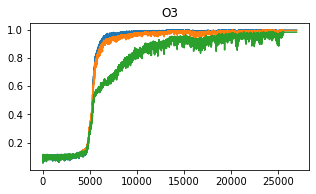

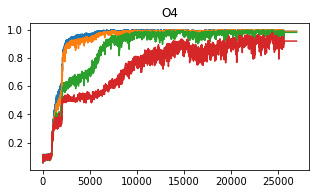

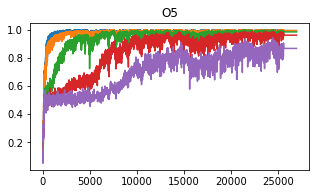

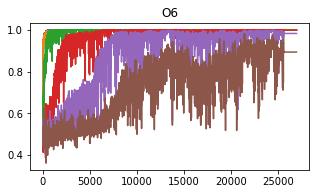

Finished epoch 1 of 1; error is 0.0

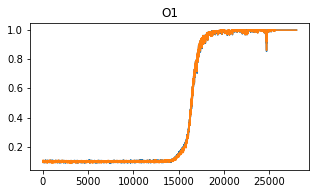

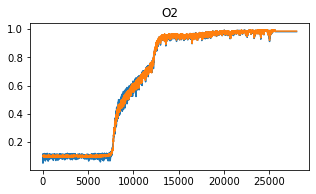

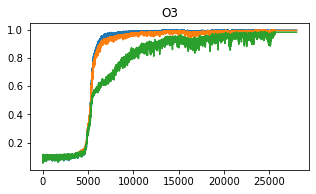

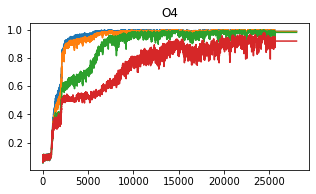

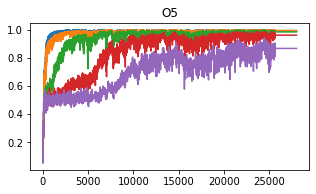

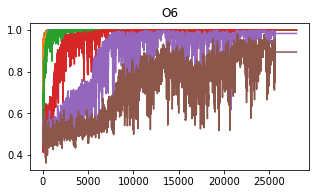

Finished epoch 1 of 1; error is 0.0

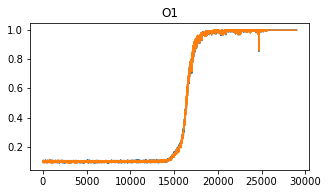

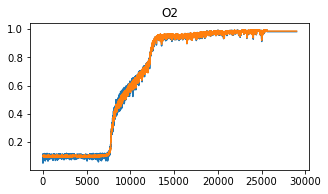

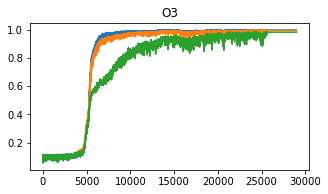

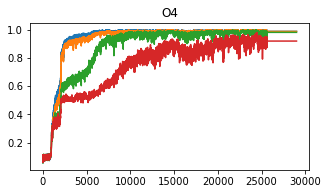

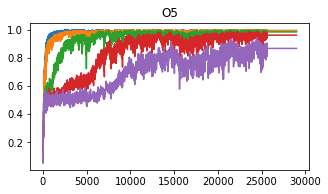

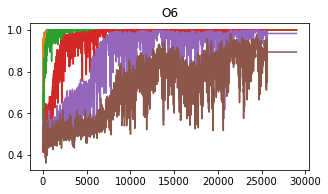

Finished epoch 1 of 1; error is 0.0

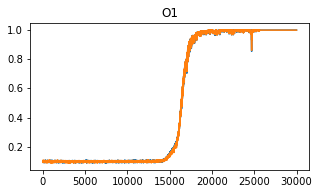

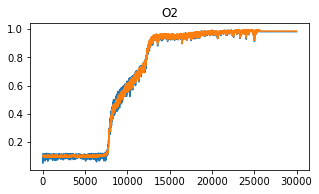

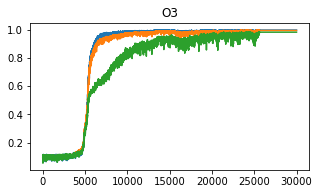

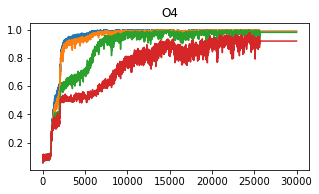

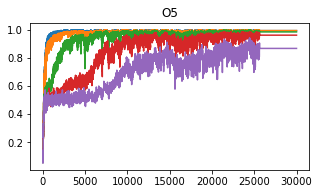

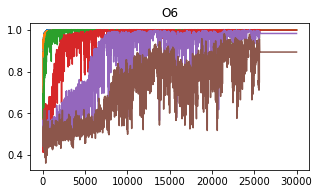

Finished epoch 1 of 1; error is 0.0

KeyboardInterrupt: 

In [21]:
for itr in range(100000):
    _ = LIM_trainer.fit(X_train[itr*batch_size:itr*batch_size + batch_size,:],
                        y_train[itr*batch_size:itr*batch_size + batch_size,:])
    for o in circuit_samplers:
        X, y = data_cache["random"]
        totalAcc[o]["random"].append(custom_classification(LIM_trainer,X, y)[o])
        X, y = data_cache["other"]
        totalAcc[o]["other"].append(custom_classification(LIM_trainer,X, y)[o])
        for c in circuit_samplers[o]:
            X,y = data_cache[(o,c)]
            totalAcc[o][c].append(custom_classification(LIM_trainer,X, y, target=[o], verbose=False)[o])
    if itr % 1000 == 0:
        show_graph(totalAcc)

In [ ]:
44443 55557 = 100000